In [5]:
!pip install pyyaml==5.1
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version

1.8.1+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [6]:
import torch
assert torch.__version__.startswith("1.8")   # need to manually install torch 1.8 if Colab changes its default version
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.8/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.8/index.html


In [7]:

import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:
aa

In [8]:
!unzip microcontroller_segmentation_data.zip
!ls

Archive:  microcontroller_segmentation_data.zip
   creating: microcontroller_segmentation_data/
   creating: microcontroller_segmentation_data/Microcontroller Segmentation/
   creating: microcontroller_segmentation_data/Microcontroller Segmentation/test/
  inflating: microcontroller_segmentation_data/Microcontroller Segmentation/test/rs00370.jpg  
  inflating: microcontroller_segmentation_data/Microcontroller Segmentation/test/rs00370.json  
  inflating: microcontroller_segmentation_data/Microcontroller Segmentation/test/rs00371.jpg  
  inflating: microcontroller_segmentation_data/Microcontroller Segmentation/test/rs00371.json  
  inflating: microcontroller_segmentation_data/Microcontroller Segmentation/test/rs00372.jpg  
  inflating: microcontroller_segmentation_data/Microcontroller Segmentation/test/rs00372.json  
  inflating: microcontroller_segmentation_data/Microcontroller Segmentation/test/rs00373.jpg  
  inflating: microcontroller_segmentation_data/Microcontroller Segmentation/t

In [9]:
import os
import numpy as np
import json
from detectron2.structures import BoxMode

def get_microcontroller_dicts(directory):
    classes =['rail','pole','platform','track-sign-front','guard-rail','track-signal-front','track-signal-back','buffer-stop','train-car']
    dataset_dicts = []
    for idx, filename in enumerate([file for file in os.listdir(directory) if file.endswith('.json')]):
        json_file = os.path.join(directory, filename)
        with open(json_file) as f:
            img_anns = json.load(f)
           

        record = {}

    
        
        filename = os.path.join(directory, img_anns["imagiPath"])
        
        record["file_name"] = filename
        record["image_id"] = idx
        record["height"] = 1080
        record["width"] = 1920
      
        annos = img_anns["shapes"]
       
        objs = []
        for anno in annos:
            # if anno['shape_type']=="boundingbox":
            #   px = [anno['points'][0],anno['points'][2]]
            #   py = [anno['points'][1],anno['points'][3]]
            # else:
            
            # print(anno['points'])
            px = [a[0] for a in anno['points']]
            py = [a[1] for a in anno['points']]
            poly = [(x, y) for x, y in zip(px, py)]
            poly = [p for x in poly for p in x]

            obj = {
                "bbox": [np.min(px), np.min(py), np.max(px), np.max(py)],
                "bbox_mode": BoxMode.XYXY_ABS,
                "segmentation": [poly],
                "category_id": classes.index(anno['label']),
                "iscrowd": 0
            }
            objs.append(obj)
        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts



In [10]:
from detectron2.data import DatasetCatalog, MetadataCatalog
for d in ["train", "test"]:
    DatasetCatalog.register("microcontroller_" + d, lambda d=d: get_microcontroller_dicts('/content/microcontroller_segmentation_data/Microcontroller Segmentation/' + d))
    MetadataCatalog.get("microcontroller_" + d).set(thing_classes=['rail','pole','guard-rail','platform','track-sign-front','track-signal-front','track-signal-back','buffer-stop','train-car'])
#microcontroller_metadata = MetadataCatalog.get("microcontroller_train")
microcontroller_metadata = MetadataCatalog.get("microcontroller_train")

In [ ]:
MetadataCatalog.remove("microcontroller_train")
MetadataCatalog.remove("microcontroller_test")


In [ ]:

DatasetCatalog.remove("microcontroller_train")

DatasetCatalog.remove("microcontroller_test")

In [ ]:
 from google.colab.patches import cv2_imshow
import cv2

In [11]:
import numpy as np
import pandas as pd
import cv2 as cv 
from google.colab.patches import cv2_imshow # for image display
from skimage import io
from PIL import Image 
import matplotlib.pylab as plt

/content/microcontroller_segmentation_data/Microcontroller Segmentation/train/rs00058.jpg


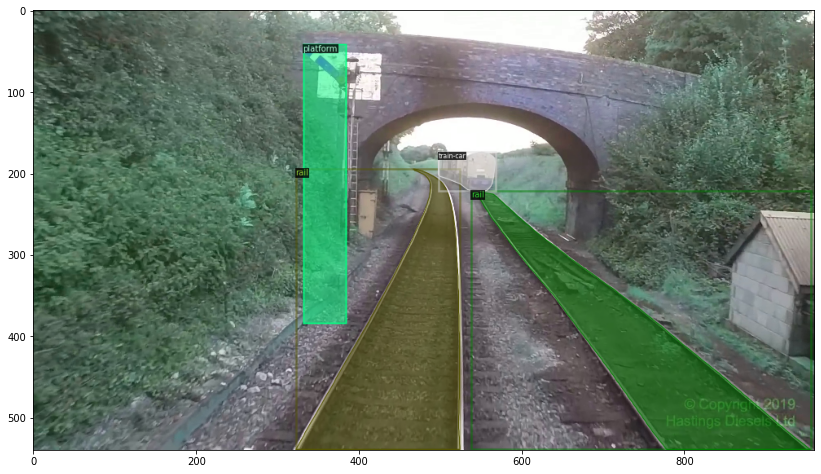

/content/microcontroller_segmentation_data/Microcontroller Segmentation/train/rs00195.jpg


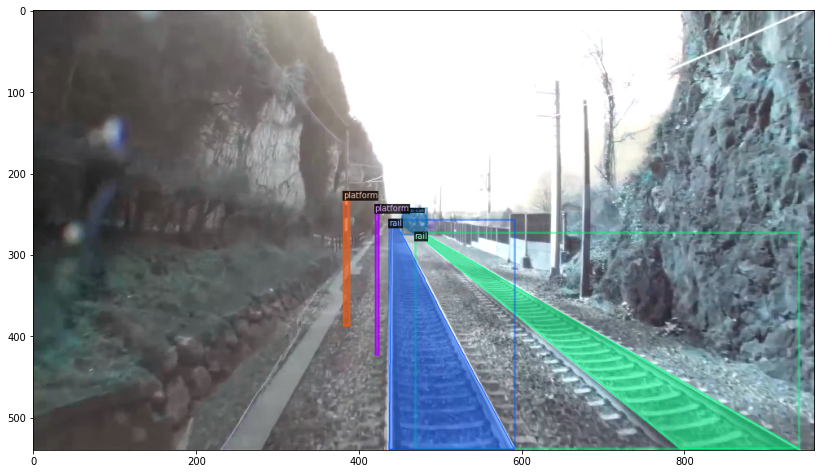

/content/microcontroller_segmentation_data/Microcontroller Segmentation/train/rs00109.jpg


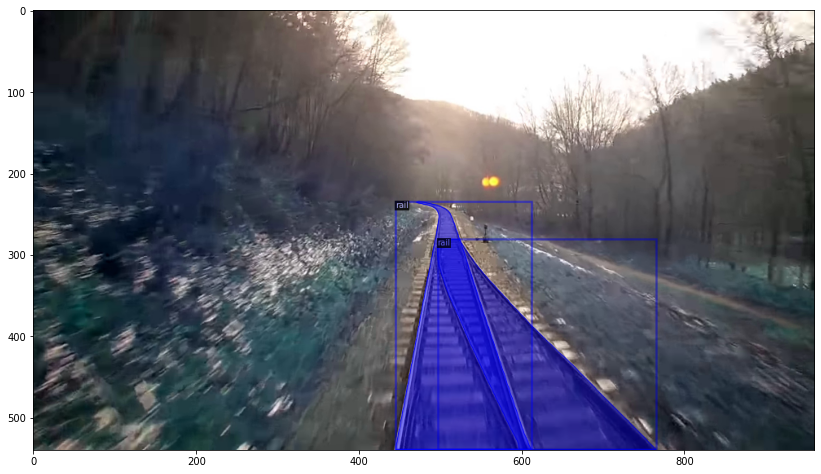

/content/microcontroller_segmentation_data/Microcontroller Segmentation/train/rs00012.jpg


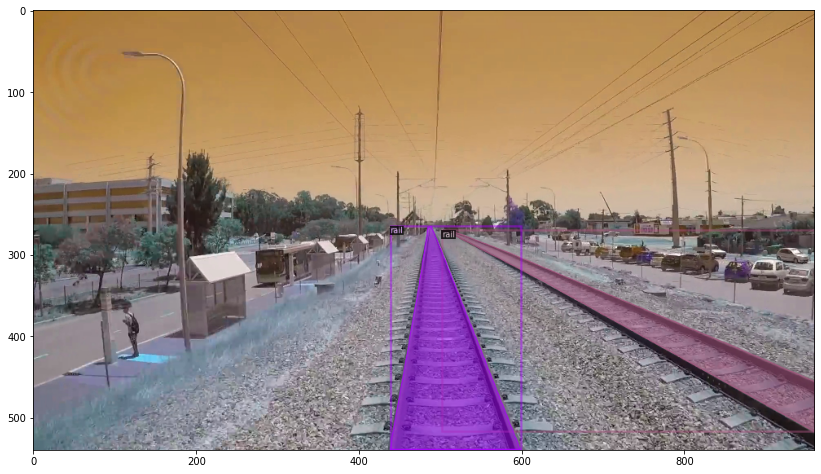

/content/microcontroller_segmentation_data/Microcontroller Segmentation/train/rs00049.jpg


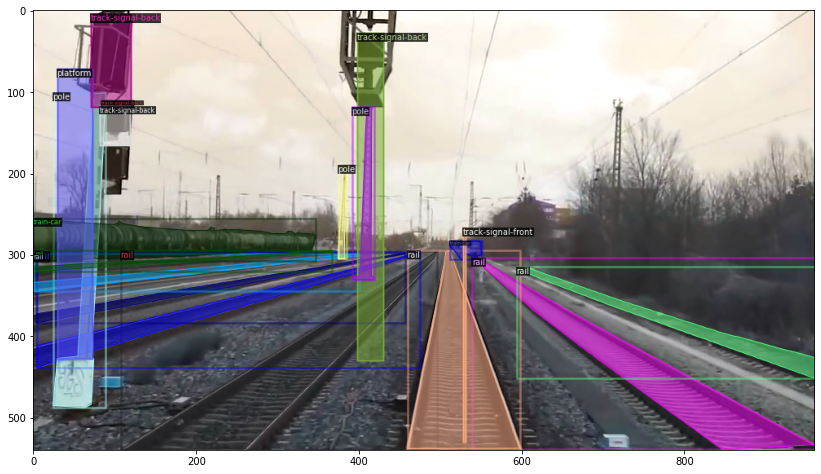

In [12]:
import random

dataset_dicts = get_microcontroller_dicts("/content/microcontroller_segmentation_data/Microcontroller Segmentation/train")
for d in random.sample(dataset_dicts, 5):
    #img = cv2.imread(d["file_name"], cv2.IMREAD_UNCHANGED)
     f = d["file_name"]
     print(f)
    #  f = f.split('/')
    #  ss = ""
    #  for i in range(1,len(f)-1):
    #    ss+="/"+f[i]
    #  nume_img = f[len(f)-1]
    #  print(nume_img)
    #  ss+="/"
    #  for i in range(len(nume_img)-3):
    #    ss+=nume_img[i]
    #  ss+='.jpg'
    #  print(ss)
     image = io.imread(f) 
     image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
     final_frame = cv.hconcat((image, image_2))
     v = Visualizer(image[:, :, ::-1], metadata=microcontroller_metadata, scale=0.5)
     v = v.draw_dataset_dict(d)
     plt.figure(figsize = (14, 10))
     plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
     plt.show()

In [13]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg

In [14]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("microcontroller_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 1500
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 9

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[06/04 08:41:17 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:08, 21.9MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (10, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (10,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (36, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (36,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due 

[06/04 08:41:26 d2.engine.train_loop]: Starting training from iteration 0
[06/04 08:41:38 d2.utils.events]:  eta: 0:13:11  iter: 19  total_loss: 7.557  loss_cls: 2.328  loss_box_reg: 0.07109  loss_mask: 0.6889  loss_rpn_cls: 3.308  loss_rpn_loc: 1.092  time: 0.5214  data_time: 0.0200  lr: 4.9953e-06  max_mem: 2673M
[06/04 08:41:48 d2.utils.events]:  eta: 0:12:51  iter: 39  total_loss: 5.269  loss_cls: 2.142  loss_box_reg: 0.05178  loss_mask: 0.6858  loss_rpn_cls: 1.601  loss_rpn_loc: 0.7122  time: 0.5122  data_time: 0.0052  lr: 9.9902e-06  max_mem: 2673M
[06/04 08:41:58 d2.utils.events]:  eta: 0:12:48  iter: 59  total_loss: 5.163  loss_cls: 1.773  loss_box_reg: 0.1053  loss_mask: 0.6775  loss_rpn_cls: 1.692  loss_rpn_loc: 0.8191  time: 0.5199  data_time: 0.0059  lr: 1.4985e-05  max_mem: 2673M
[06/04 08:42:09 d2.utils.events]:  eta: 0:12:44  iter: 79  total_loss: 4.019  loss_cls: 1.329  loss_box_reg: 0.1036  loss_mask: 0.6663  loss_rpn_cls: 1.123  loss_rpn_loc: 0.9119  time: 0.5236  dat

In [15]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5 
cfg.DATASETS.TEST = ("microcontroller_test", )
predictor = DefaultPredictor(cfg)

In [16]:
from detectron2.utils.visualizer import ColorMode

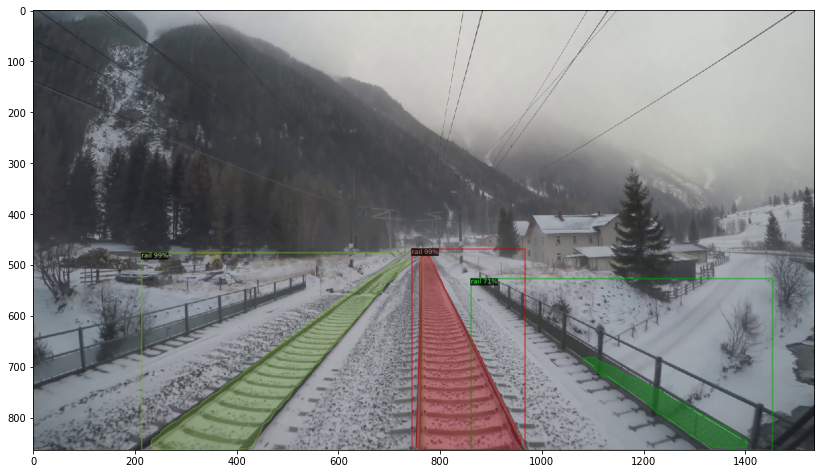

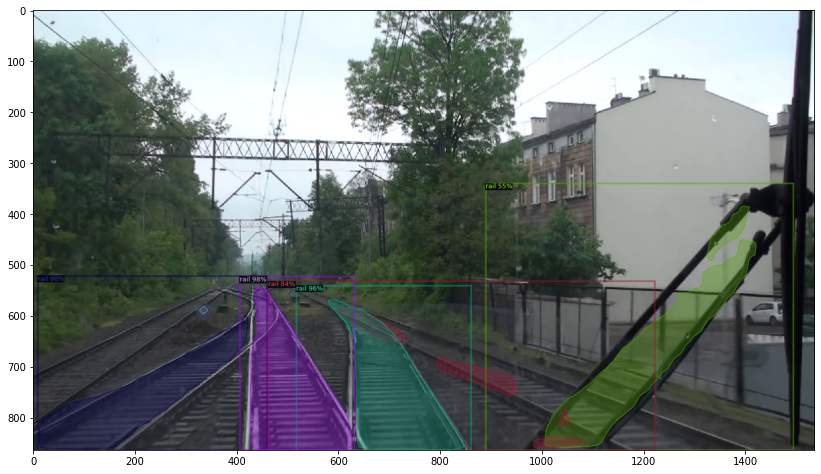

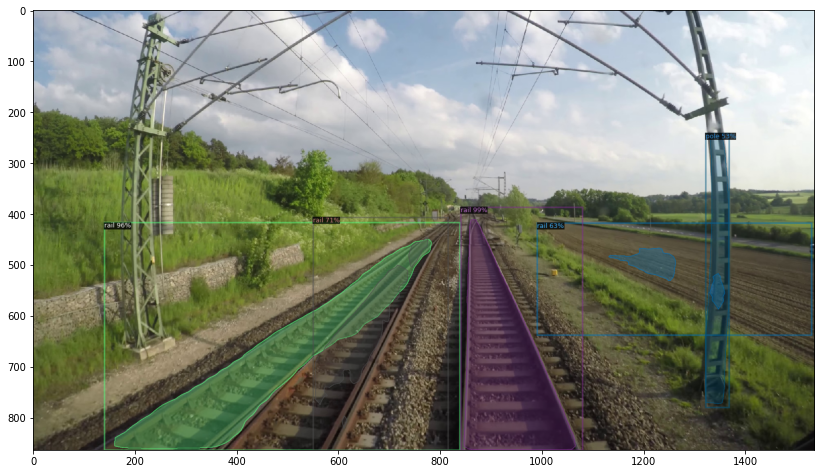

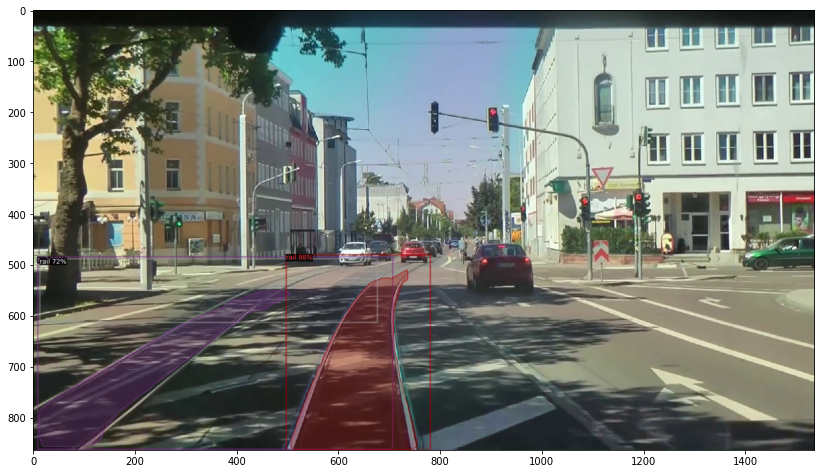

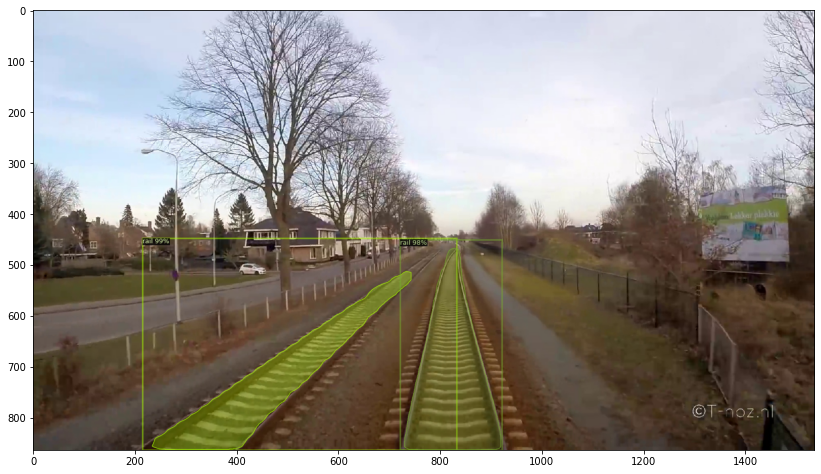

...

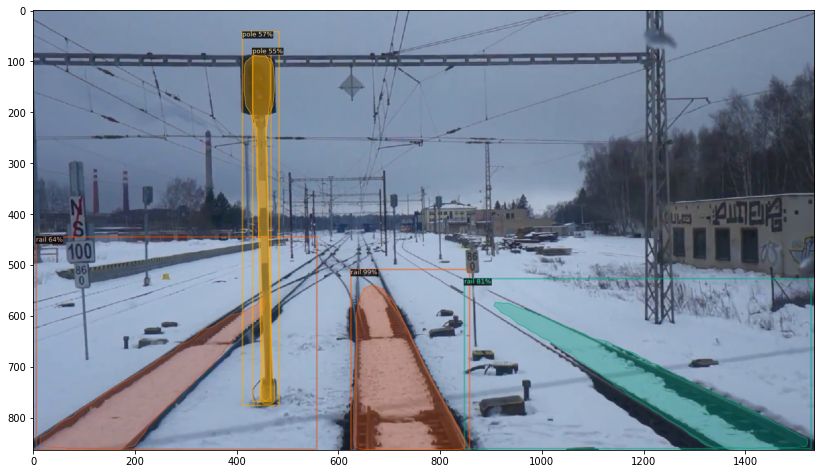

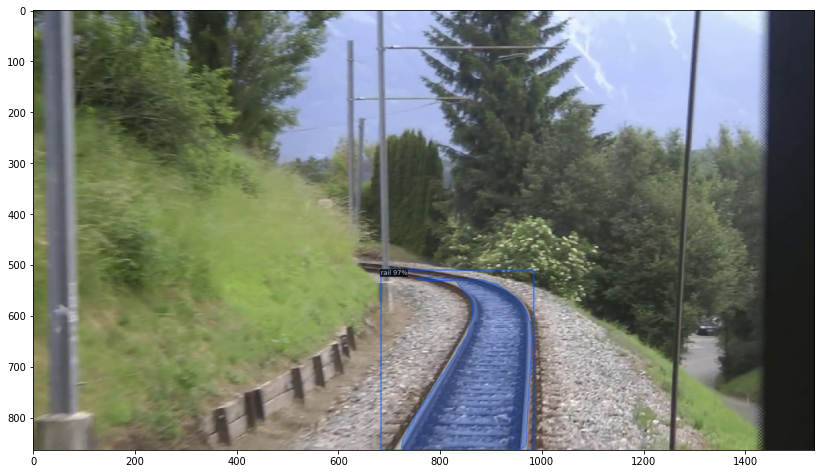

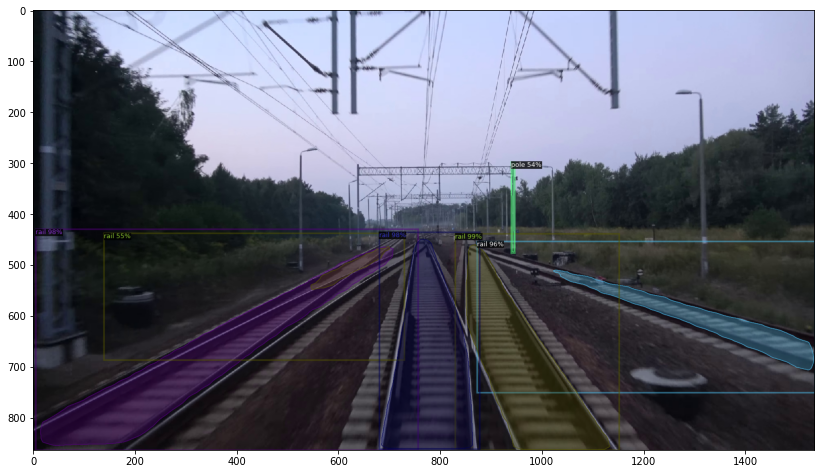

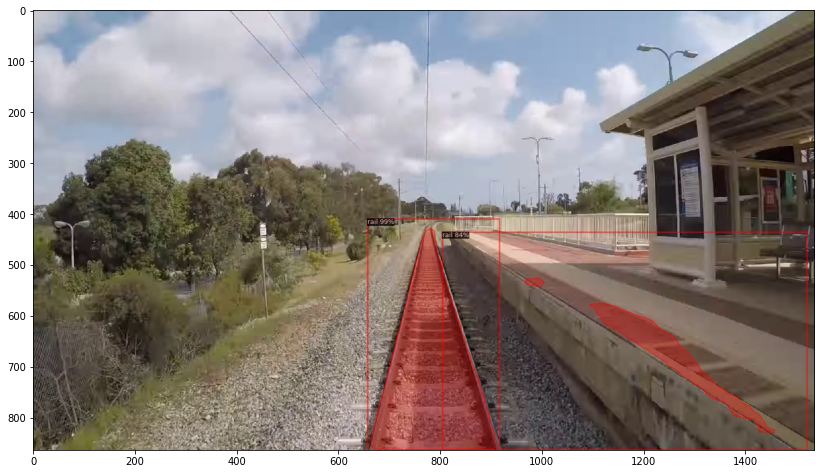

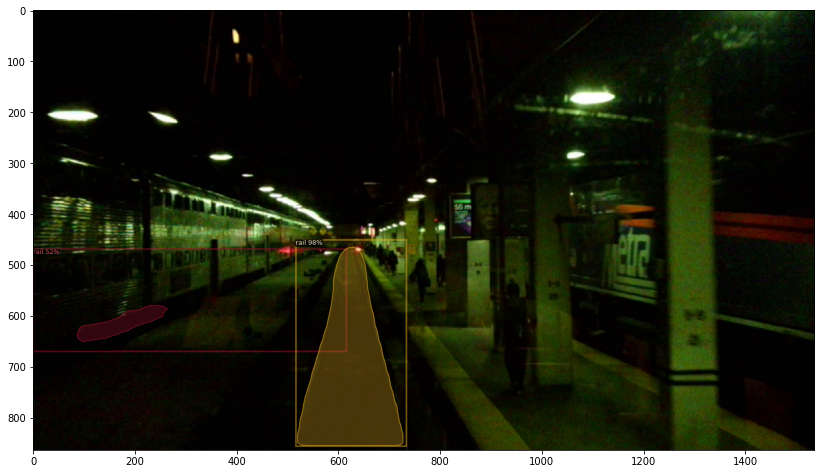

In [19]:
dataset_dicts = get_microcontroller_dicts('/content/microcontroller_segmentation_data/Microcontroller Segmentation/test')


for d in random.sample(dataset_dicts,18):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=microcontroller_metadata, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))